In [1]:
#* for data manipulation 
import pandas as pd 
import numpy as np 

import tiling_disk_plots as tdp
import tiling_disk_utils as tdu

#* for plotting: 
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline
sns.set_theme(style="ticks")
sns.set_context("talk")
#

# ref measurement

import

In [2]:
before_hardening_tripplets_df = tdu.read_single_measurement('measurements/triplets', '20220310_trip_v4_pink_slow_bfg_novac.txt')
before_hardening_tripplets_df = tdu.df_convert_unix_to_datetime(before_hardening_tripplets_df)

examine raw data

(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Count'>)

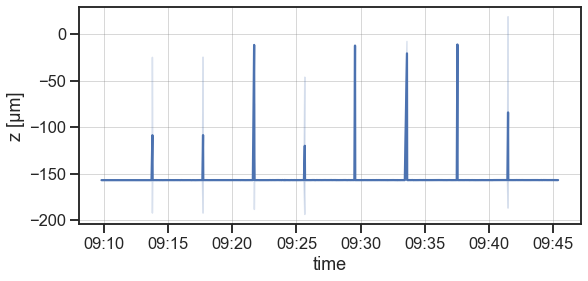

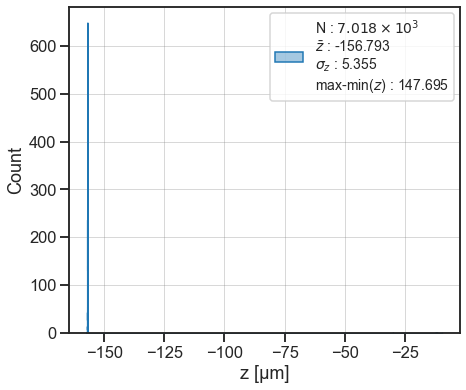

In [3]:
tdp.plot_data_vs_time(before_hardening_tripplets_df)
tdp.ts_hist(before_hardening_tripplets_df)

clean everything more then $\pm$ 100µm deviation from mean of single hexagon 

In [4]:
ref_mean = before_hardening_tripplets_df.z.median()
print(ref_mean)
before_hardening_tripplets_df = tdu.remove_outliers(
                                before_hardening_tripplets_df,
                                cut_threshold=0.1
                                ) # kill everything over 100µm

-156.993


In [5]:
before_hardening_tripplets_df.z.count()

7018

In [6]:
before_hardening_tripplets_df.z_clean.isna().count()

7018

In [7]:
before_hardening_tripplets_df.head(5)

,run_nr,hex_nr,point,x,y,z,unix_time,datetime,z_clean
0,1,19,1,-93.20,61.00,-157.042,1646899788,2022-03-10 09:09:48+01:00,-157.042
1,1,19,1,-93.39,61.19,-157.035,1646899788,2022-03-10 09:09:48+01:00,-157.035
2,1,19,1,-93.64,61.25,-157.011,1646899788,2022-03-10 09:09:48+01:00,-157.011
3,1,19,1,-93.89,61.19,-157.023,1646899789,2022-03-10 09:09:49+01:00,-157.023
4,1,19,1,-94.07,61.00,-157.048,1646899789,2022-03-10 09:09:49+01:00,-157.048


examine remaining data

(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Count'>)

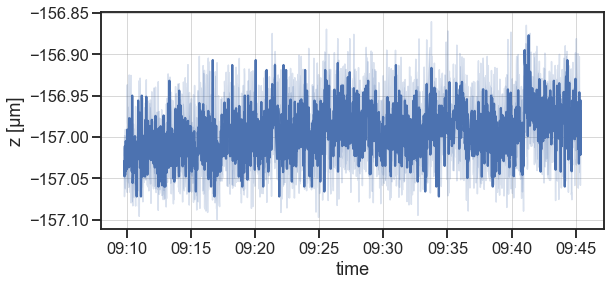

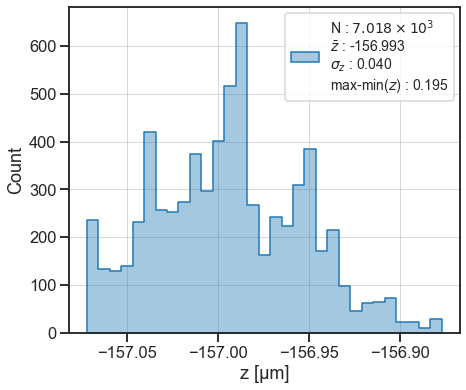

In [8]:
tdp.plot_data_vs_time(before_hardening_tripplets_df, mode='z_clean')
bins = np.arange(before_hardening_tripplets_df.z_clean.min(), before_hardening_tripplets_df.z_clean.max(), 12e-3)
tdp.ts_hist(before_hardening_tripplets_df, mode='z_clean')


In [9]:
bf_curing_pt = tdu.point_table(before_hardening_tripplets_df, z_col='z_clean')

In [10]:
bf_curing_pt.head(3)

,hex_nr,point,unix_time,x,y,z_clean_measurement_error,z_clean_nan_mean
0,3,1,1.646901e+09,-28.39,-52.27,0.017939,-156.975545
1,3,2,1.646901e+09,-29.27,-43.95,0.015692,-156.976917
2,3,3,1.646901e+09,-23.44,-47.32,0.016715,-156.964154


c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:156: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


(<Figure size 576x576 with 5 Axes>,
 (<AxesSubplot:>,
  <AxesSubplot:xlabel='x [mm]'>,
  <AxesSubplot:ylabel='y [mm]'>))

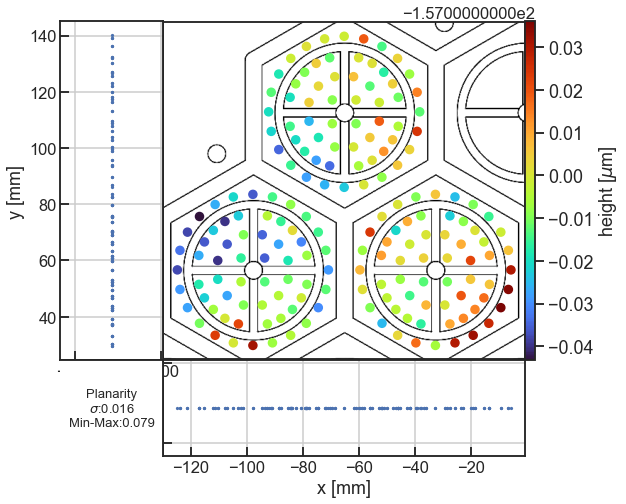

In [11]:
bf_curing = tdu.add_triplet_color_label(bf_curing_pt)
t_df = bf_curing_pt[bf_curing_pt.trip_color=='blue']
min_, mean_, max_ = tdu.calc_min_mean_max(t_df, mode='z_clean_nan_mean')
tdp.plot_table_hexagon_flatness(t_df, mode='z_clean_nan_mean', cbar_norm = (min_,mean_,max_))

## curing data

In [12]:
curing_triplets_df = tdu.read_single_measurement('measurements/triplets', '20220310_trip_v4_pink_slow_curing.txt')
curing_triplets_df = tdu.df_convert_unix_to_datetime(curing_triplets_df)

In [13]:
curing_triplets_df.tail()

,run_nr,hex_nr,point,x,y,z,unix_time,datetime
182513,26,11,60,25.65,-120.26,-157.017,1646999394,2022-03-11 12:49:54+01:00
182514,26,11,60,25.83,-120.44,-156.993,1646999394,2022-03-11 12:49:54+01:00
182515,26,11,60,26.08,-120.51,-157.011,1646999394,2022-03-11 12:49:54+01:00
182516,26,11,60,26.33,-120.44,-157.005,1646999394,2022-03-11 12:49:54+01:00
182517,26,11,60,26.51,-120.26,-157.023,1646999395,2022-03-11 12:49:55+01:00


(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Count'>)

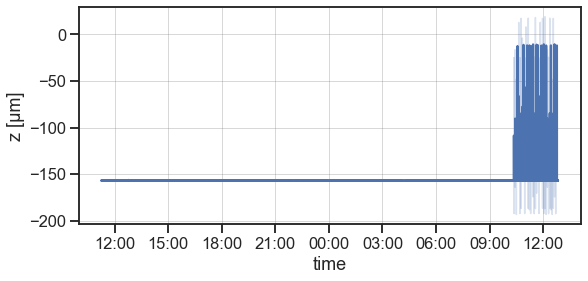

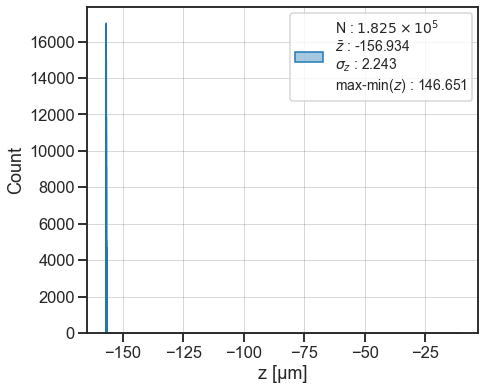

In [14]:
tdp.plot_data_vs_time(curing_triplets_df)
tdp.ts_hist(curing_triplets_df)

In [15]:
curing_triplets_df = tdu.remove_outliers(curing_triplets_df, mode='z' ,cut_threshold=0.100)

(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Count'>)

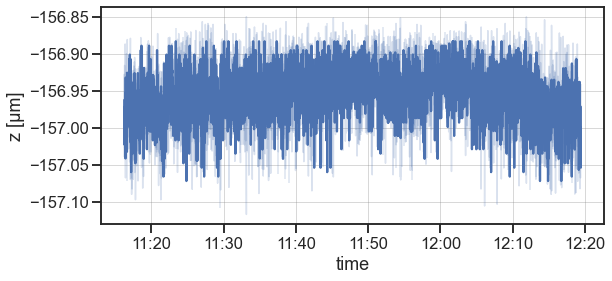

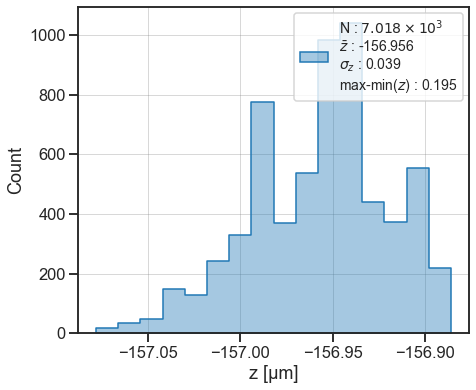

In [16]:
tdp.plot_data_vs_time(curing_triplets_df.loc[curing_triplets_df.run_nr==1,:], mode='z_clean')
bins = np.arange(curing_triplets_df.z_clean.min(), curing_triplets_df.z_clean.max(), 12e-3)
tdp.ts_hist(curing_triplets_df.loc[curing_triplets_df.run_nr==1,:],mode='z_clean', plot_bins=bins)

c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:156: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


(<Figure size 576x576 with 5 Axes>,
 (<AxesSubplot:>,
  <AxesSubplot:xlabel='x [mm]'>,
  <AxesSubplot:ylabel='y [mm]'>))

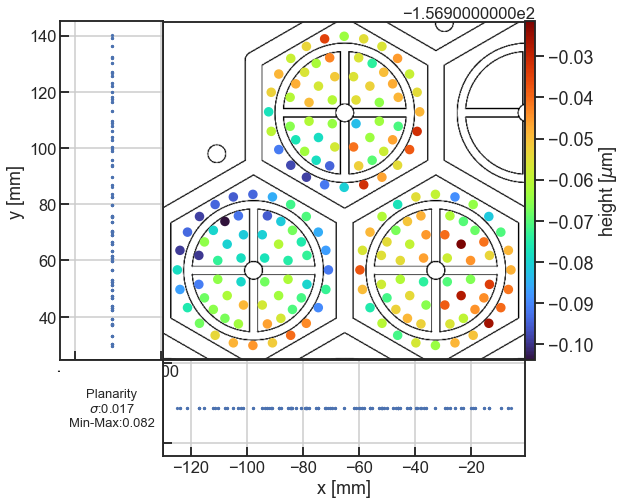

In [17]:
c_pt = tdu.point_table(curing_triplets_df.loc[curing_triplets_df.run_nr==1,:], z_col='z_clean')
c_pt = tdu.add_triplet_color_label(c_pt)
ct_pt = c_pt[c_pt.trip_color=='blue']
min_, mean_, max_ = tdu.calc_min_mean_max(ct_pt, mode='z_clean_nan_mean')
tdp.plot_table_hexagon_flatness(ct_pt, mode='z_clean_nan_mean', cbar_norm = (min_,mean_,max_))

## split data into runs

In [18]:
measurements_dict = {}
for run in curing_triplets_df.run_nr.unique(): 
    data = curing_triplets_df.loc[curing_triplets_df.run_nr == run, :]
    # print(data)
    measurements_dict[f'run_nr_{run}'] = data

In [19]:
measurements_dict_pt = {key: tdu.point_table(data,z_col='z_clean') for key, data in measurements_dict.items()}

In [20]:
for run_nr, data in measurements_dict_pt.items(): 
    data['run_nr'] = run_nr.split('_')[2]

In [21]:
measurements_dict_pt = {key: tdu.add_triplet_color_label(data) for key, data in measurements_dict_pt.items()}

In [22]:
measurements_dict_pt['run_nr_1'].head(5)

,hex_nr,point,unix_time,x,y,z_clean_measurement_error,z_clean_nan_mean,run_nr,trip_color
0,3,1,1.646910e+09,-28.39,-52.27,0.014550,-156.934455,1,yellow
1,3,2,1.646910e+09,-29.27,-43.95,0.014255,-156.933455,1,yellow
2,3,3,1.646910e+09,-23.44,-47.32,0.013676,-156.935545,1,yellow
3,3,4,1.646910e+09,-20.07,-53.15,0.016071,-156.931091,1,yellow
4,3,5,1.646910e+09,-13.31,-51.33,0.013205,-156.931625,1,yellow


In [23]:
mean_str = 'z_clean_nan_mean'
err_str = 'z_clean_measurement_error'
measurements_dict_pt = {key: tdu.combine_mean_measurements(data,
                                                             bf_curing_pt,
                                                              z_mean_col=mean_str,
                                                              z_err_col=err_str
                                                              ) for key, data in measurements_dict_pt.items()}

In [24]:
measurements_dict_pt['run_nr_6'].head(3)

,hex_nr,point,unix_time,x,y,z_clean_measurement_error,z_clean_nan_mean,run_nr,trip_color
0,3,1,1.646929e+09,-28.39,-52.27,0.022008,0.026315,6,yellow
1,3,2,1.646929e+09,-29.27,-43.95,0.022675,0.034817,6,yellow
2,3,3,1.646929e+09,-23.44,-47.32,0.022233,0.015699,6,yellow


In [25]:
for key, data in measurements_dict_pt.items():
    data.rename(columns = {mean_str:'z_mean', err_str:'z_err'}, inplace = True)
    data['z_mean'] = data['z_mean'].apply(lambda z: z*1e3) #* mm -> µm
    data['z_err'] = data['z_err'].apply(lambda z: z*1e3) #* mm -> µm
    data.z_mean = tdu.subtract_mean(data.z_mean)
    measurements_dict_pt[key] = data

c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(ncols=1, nrows=1, figsize=figsize)


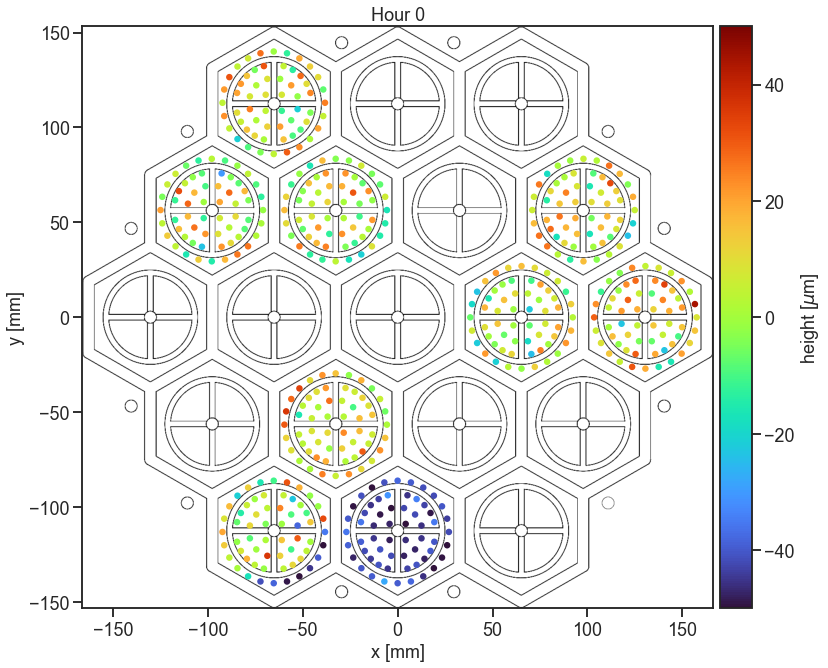

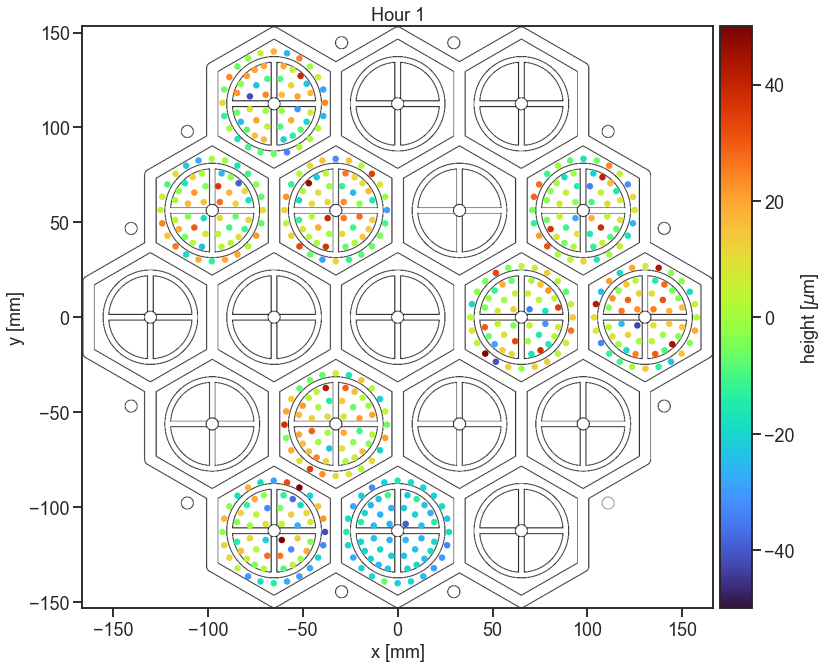

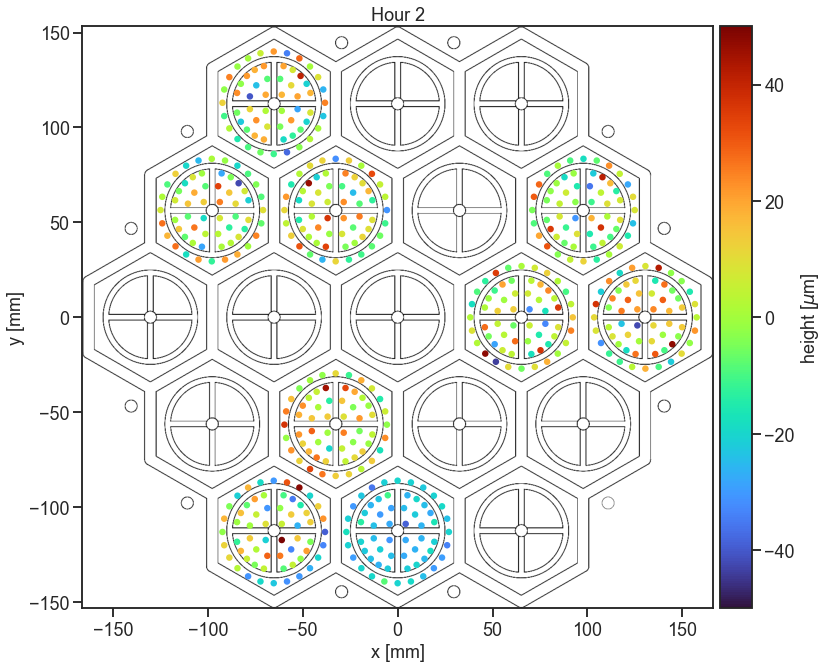

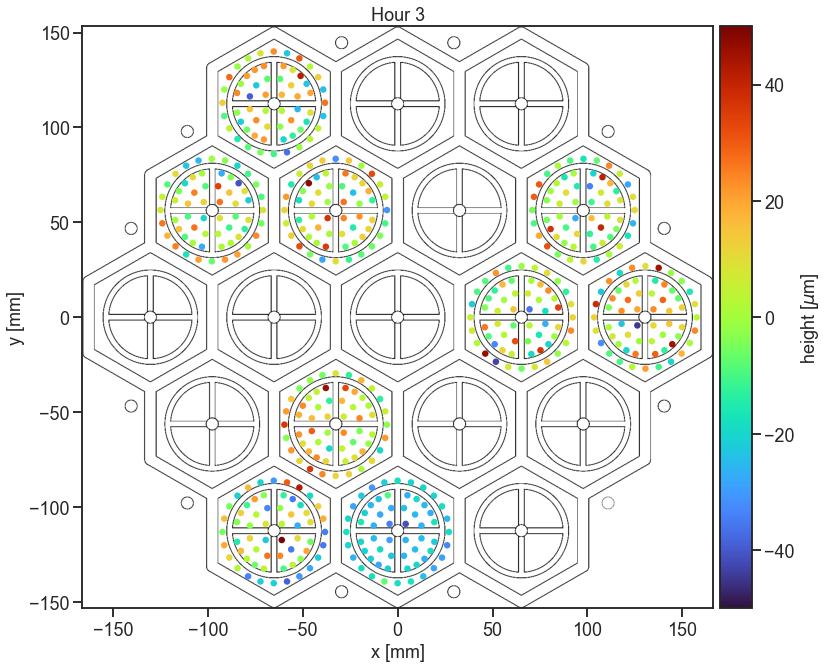

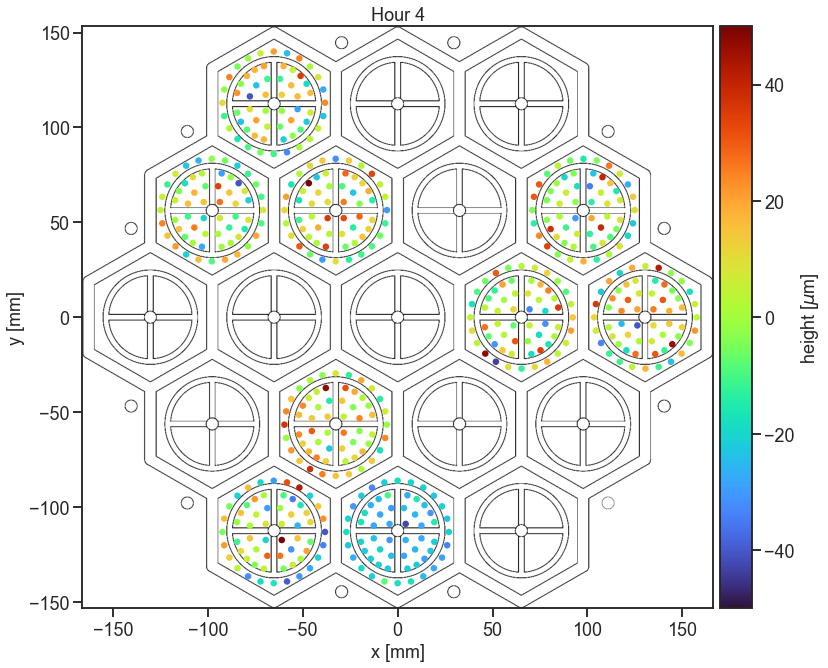

...

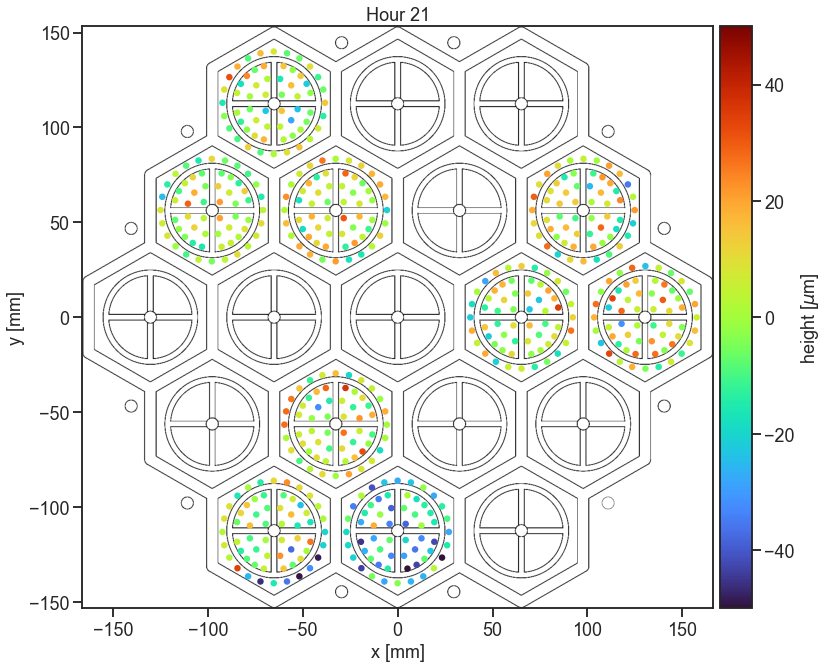

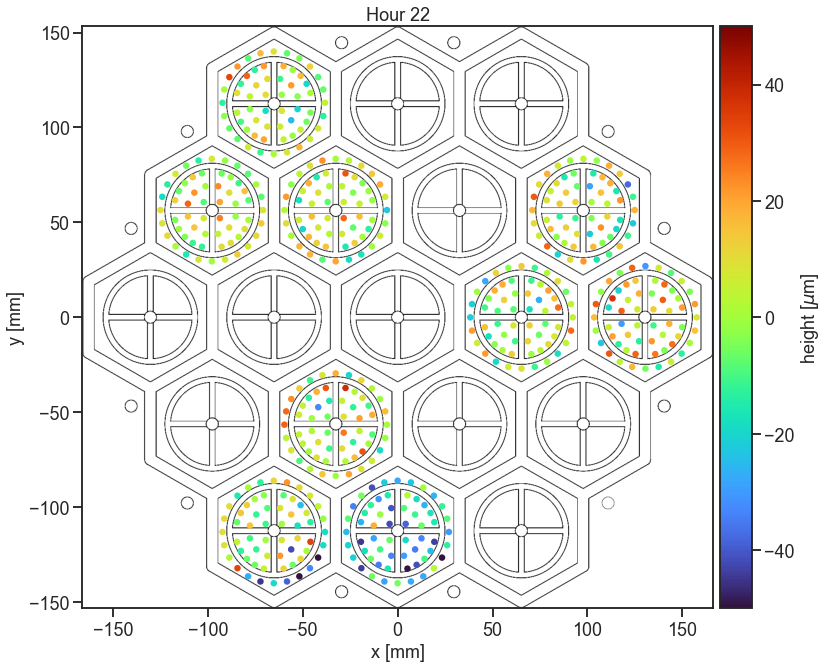

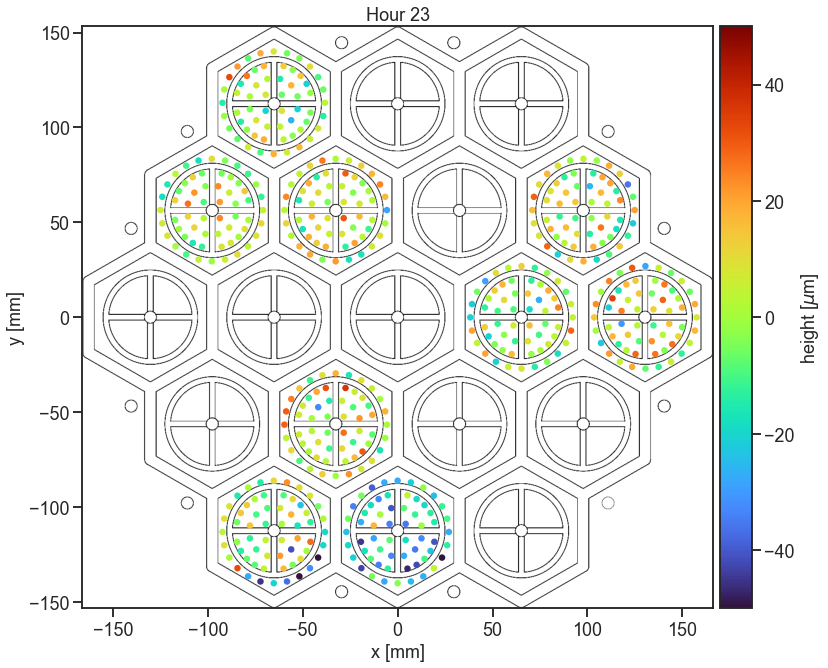

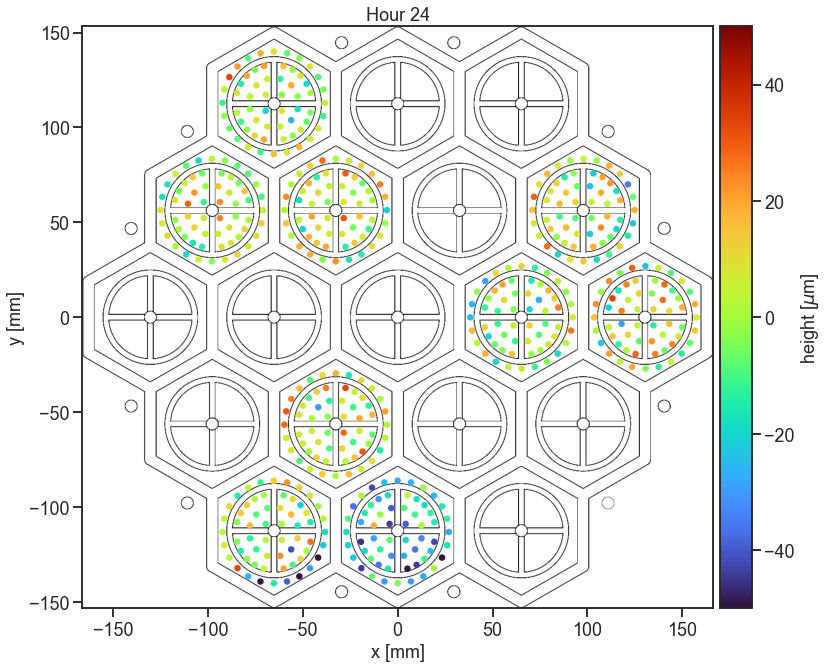

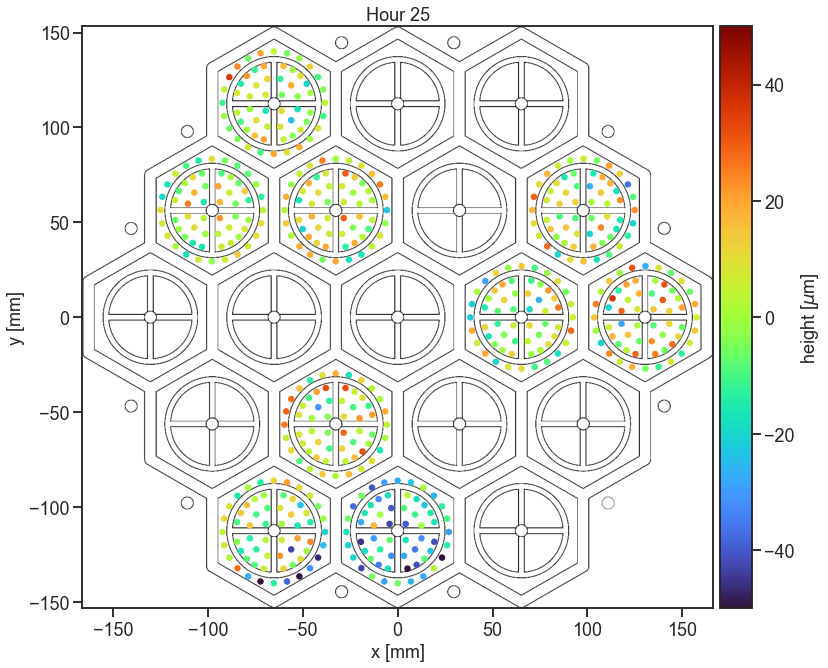

In [26]:
for key, data in measurements_dict_pt.items(): 
    run_nr = int(key.split('_')[2])
    fig, ax = tdp.full_hexagon_plot(data, mode=('z_mean'), size=5**2, cbar_norm=(-50, 0, 50), cmap='turbo', title=f'Hour {run_nr -1}')

joyplot

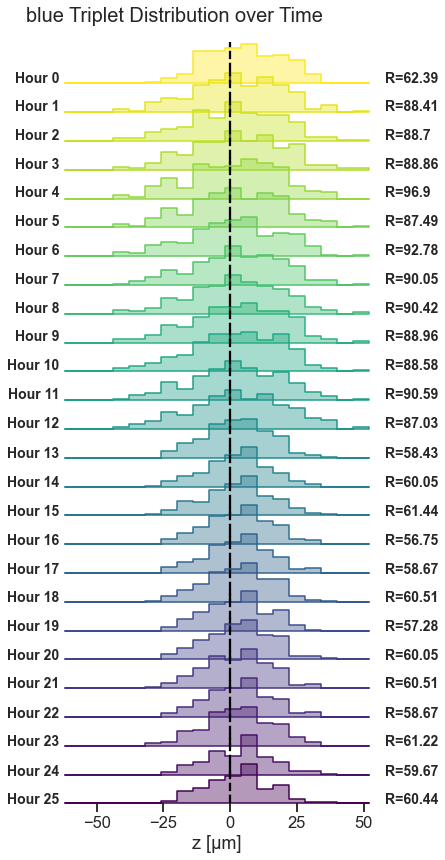

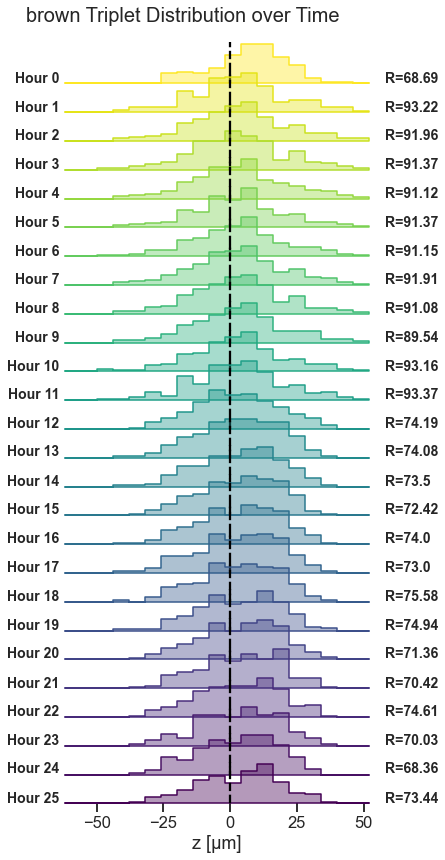

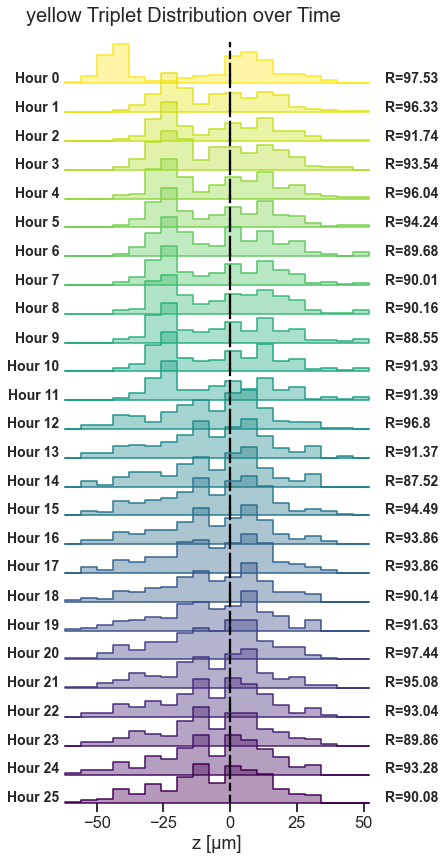

In [27]:
for col in ['blue', 'brown', 'yellow']:
    tdp.plot_triplet_dist_joyplot(measurements_dict_pt, col)

c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:156: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


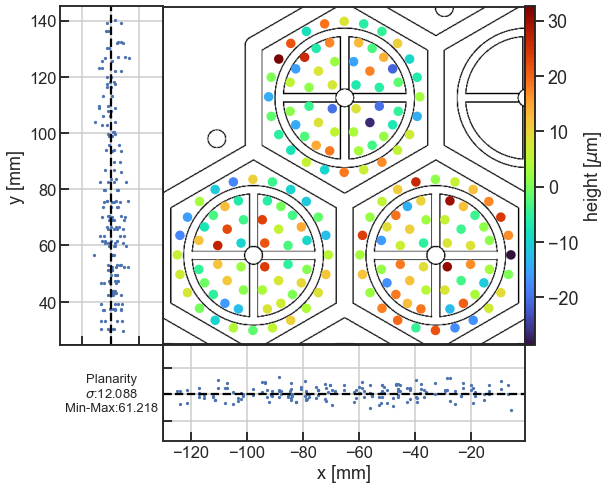

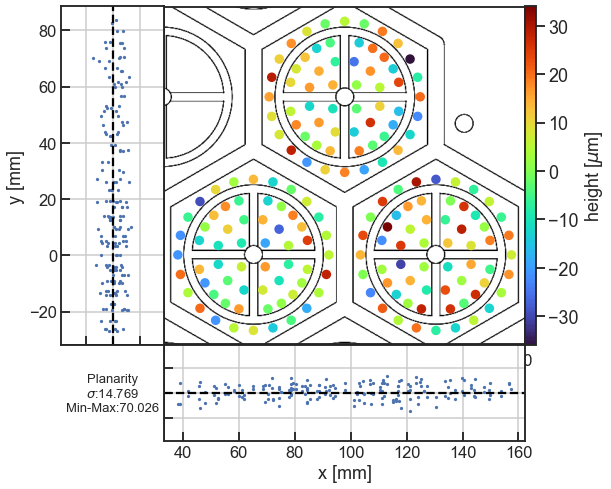

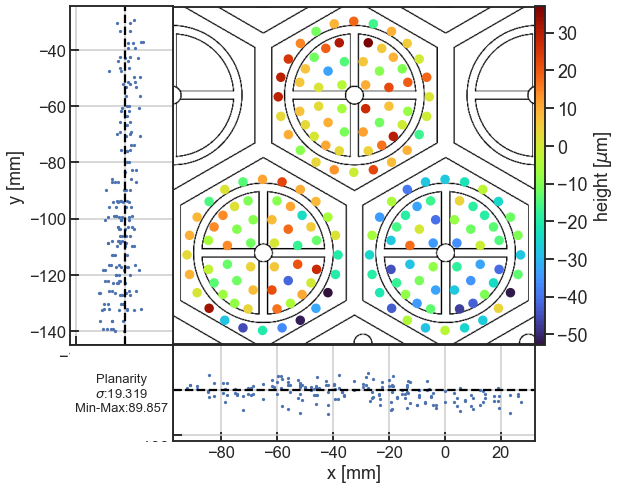

In [28]:

for col in ['blue', 'brown', 'yellow']:
    plot_df = measurements_dict_pt['run_nr_24']
    plot_df = plot_df[plot_df.trip_color==col]
    min_, mean_, max_ = tdu.calc_min_mean_max(plot_df, mode='z_mean')
    tdp.plot_table_hexagon_flatness(plot_df, mode='z_mean', cbar_norm = (min_,mean_,max_))

## hier mach ich den fit jetzt ein für alle mal

In [29]:
# Define your PDF / model
def f(x, par):
    """Normalized Gaussian"""
    mu = par[0]
    sigma = par[1]
    return 1 / np.sqrt(2 * np.pi) / sigma * np.exp(-(x - mu) ** 2 / 2. / sigma ** 2)


class ChiSquared:                   # function to be minimized
    #stolen by G.Cowan Lecture: data analysis for particle physics
    def __init__(self, xHist, bin_edges):
        self.setData(xHist, bin_edges)
        
    def setData(self, xHist, bin_edges):
        numVal = np.sum(xHist)
        numBins = len(xHist)
        binSize = bin_edges[1] - bin_edges[0]
        self.data = xHist, bin_edges, numVal, numBins, binSize
        
    def chi2M(self, par):            # multinomial maximum likelihood
        xHist, bin_edges, numVal, numBins, binSize = self.data
        xMid = bin_edges[:numBins] + 0.5*binSize
        binProb = f(xMid, par)*binSize
        nu = numVal*binProb
        lnL = 0.
        for i in range(len(xHist)):
            if xHist[i] > 0.:
                lnL += xHist[i]*np.log(nu[i]/xHist[i])
        return -2.*lnL
    def __call__(self, par):
        return self.chi2M(par)

In [30]:
def fit_xhist_data(dataframe, mode='z',bin_size=12): 
    from iminuit import Minuit
    from probfit import mid
    from scipy.stats import chi2
    mu = 0
    sigma = 40
    xData = dataframe[mode].to_numpy()[~(np.isnan(dataframe[mode]))]
    numVal = dataframe[mode].count()
    xMin = dataframe[mode].min()
    xMax = dataframe[mode].max()
    numBins = xMax - xMin // bin_size
    numBins = int(numBins)
    xHist, bin_edges = np.histogram(xData, bins=numBins, range=(xMin, xMax))
    binSize = bin_edges[1] - bin_edges[0]
    # cost functuion
    # Initialize Minuit and set up fit:
    parin   = np.array([mu, sigma])      # initial values (here = true)
    parname = ['mu', 'sigma']
#     parstep = np.array([1., 1.])         # initial setp sizes
    parlim  = [(None, None),  (0., None)]
    chisq = ChiSquared(xHist, bin_edges)
    m = Minuit(chisq, parin, name=parname)
#     m.errors = parstep
    m.limits = parlim
    m.errordef = 1.0      

    # minimize function
    m.migrad()
    parhat = m.values                                 # max-likelihood estimates
    sigma_parhat = m.errors                           # standard deviations
    cov = m.covariance                                # covariance matrix
    rho = m.covariance.correlation()                  # correlation coeffs.
    print(r"par index, name, estimate, standard deviation:")
    for i in range(m.npar):
        if not m.fixed[i]:
            print("{:4d}".format(i), "{:<10s}".format(m.parameters[i]), " = ",
            "{:.6f}".format(parhat[i]), " +/- ", "{:.6f}".format(sigma_parhat[i]))
            
    # Retrieve minimized chi-squared, etc.
    ndof = numBins - m.nfit - 1           # for fixed numVal
    chi2min = chisq(parhat)
    print ("chi2min = ", chi2min, ",     ndof = ", ndof)
    pval = chi2.sf(chi2min, ndof)
    print ("pval = ", pval)
    return parhat, sigma_parhat

In [31]:

def plot_triplet_dist_joyplot(all_triplet_data_dict, triplet_color='blue'): 

    from matplotlib import cm
    n_hours = len(all_triplet_data_dict)
    colors = cm.viridis_r(np.linspace(0, 1, n_hours))
    fig, axes = plt.subplots(n_hours,1, figsize=(6,14))
    i = 0
    z_global_max = 0 
    z_global_min = 0
    for key, data in all_triplet_data_dict.items(): 
        z_min = data.z_mean.min()
        z_max = data.z_mean.max()
        if z_max > z_global_max: z_global_max = np.rint(z_max)
        if z_min < z_global_min: z_global_min = np.rint(z_min)
    # print(z_global_max)
    # print(z_global_min)
    if z_global_max > 500: z_global_max = 100
    if z_global_min < -500: z_global_min = -100
    # print(z_global_max)
    # print(z_global_min)
    
    for (key, data), ax, color in zip(all_triplet_data_dict.items(), axes, colors): 
        run_nr = int(key.split('_')[2])
        data = data.loc[data.trip_color==triplet_color,:]
        z_min = data.z_mean.min()
        z_max = data.z_mean.max()
        R = z_max - z_min
        R = np.round(R,2) 
        
        nbins = np.arange(z_global_min, z_global_max ,6)
        sns.histplot(data['z_mean'], kde=False, ax=ax, element='step', color=color,
                    stat='probability', label=f'Hour {run_nr-1}', fill=True, alpha=0.4, 
                    bins=nbins,)
        ax.spines.top.set_color('none')
        ax.spines.right.set_color('none')
        ax.axvline(0,0,1, ls='--', color='black')
        # ax.grid(True)
        plt.subplots_adjust(hspace=-0.3)
        # make background transparent
        rect = ax.patch
        rect.set_alpha(0)
        # remove borders, axis ticks, and labels
        ax.set_yticklabels([])
        ax.set_yticks([])
        ax.set_ylabel('')
        if i == n_hours - 1:
            ax.set_xlabel('z [µm]')
        else:
            ax.set_xticklabels([])
            ax.set_xticks([])
            ax.set_xlabel('')
        i+=1
        # sig estimation:
        parhat, sig_parhat = fit_xhist_data(data, mode='z_mean')
        sigma = parhat[1]
        delta_sigma = sig_parhat[1]
        spines = ["top","right","left","bottom"]
        for s in spines:
            ax.spines[s].set_visible(False)
        ax.text(z_global_min -2 ,0.02,f'Hour {run_nr-1}',fontweight="bold",fontsize=14,ha="right", va='center')
        ax.text(z_global_max+2 ,0.02,'$\sigma$='+f'{tdp.LatexFormat(sigma)}'+'$\pm$'+f'{tdp.LatexFormat(delta_sigma)}',fontweight="bold",fontsize=14,ha="left", va='center')
    fig.text(0.07,0.9,f"{triplet_color} Triplet Distribution over Time",fontsize=20)
    return fig, axes

#Todo: fit richtig visualisieren!

In [32]:
fit_df = measurements_dict_pt['run_nr_24']
fit_df = fit_df.loc[fit_df.trip_color=='blue',:]


C:\Users\Domin\AppData\Local\Temp\ipykernel_7816\3724413645.py:22: InitialParamWarning: Parameter mu does not have neither initial value nor limits.
  m = Minuit(chisq, parin, name=parname)
C:\Users\Domin\AppData\Local\Temp\ipykernel_7816\3724413645.py:22: InitialParamWarning: Parameter sigma does not have neither initial value nor limits.
  m = Minuit(chisq, parin, name=parname)
C:\Users\Domin\AppData\Local\Temp\ipykernel_7816\3724413645.py:22: InitialParamWarning: errordef is not given, defaults to 1.
  m = Minuit(chisq, parin, name=parname)


AttributeError: 'iminuit._libiminuit.Minuit' object has no attribute 'limits'

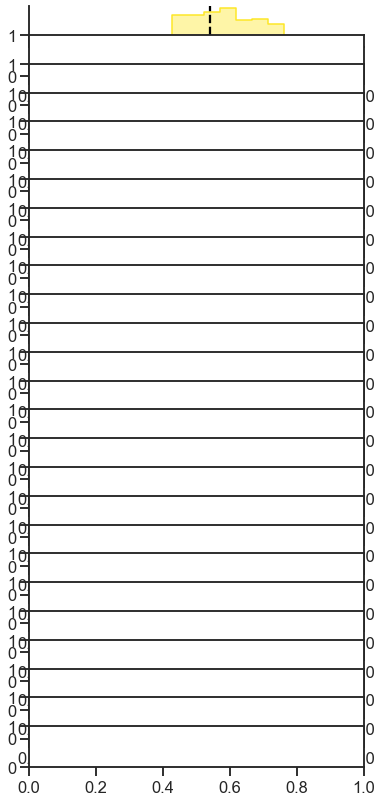

In [33]:
for col in ['blue', 'brown', 'yellow']:
    plot_triplet_dist_joyplot(measurements_dict_pt, col)
    #TODO: plot sig vs time
    #todo: plot chisq vs time
    #todo plot mu vs time
    #todo plot sig vs vel
    #todo mach ne präsi zum entscheiden 